# galaxy data

In [ ]:
#############################
### for small data volume ###
#############################

# import pandas as pd

# files = ['small_fiducial', 'small_modeled', 'small_spectro', 'data']

# for name in files:
#     csv_path = f"./data/{name}.csv"
#     print(f"Converting {name}...")
#     df = pd.read_csv(csv_path)
    
#     parquet_path = f"./data/{name}.parquet"
#     df.to_parquet(parquet_path)
#     print(f"Saved: {parquet_path}")


Converting small_fiducial...
Saved: ./data/small_fiducial.parquet
Converting small_modeled...
Saved: ./data/small_modeled.parquet
Converting small_spectro...
Saved: ./data/small_spectro.parquet
Converting data...
Saved: ./data/data.parquet


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import healpy as hp

gal_small_fiducial_df = pd.read_parquet("./data/small_fiducial.parquet")
print('-------columns--------')
print(gal_small_fiducial_df.columns)
print('catalog num: ' + str(len(gal_small_fiducial_df)))

gal_small_modeled_df = pd.read_parquet("./data/small_modeled.parquet")
print(gal_small_modeled_df.head())

gal_small_spectro_df = pd.read_parquet("./data/small_spectro.parquet")
print(gal_small_spectro_df.head())

gal_data_df = pd.read_parquet("./data/data.parquet")
print(gal_data_df.head())

-------columns--------
Index(['mag_true_g_lsst_no_host_extinction', 'dec_true',
       'mag_true_i_lsst_no_host_extinction',
       'Mag_true_g_lsst_z0_no_host_extinction',
       'Mag_true_r_lsst_z0_no_host_extinction',
       'Mag_true_i_lsst_z0_no_host_extinction',
       'mag_true_r_lsst_no_host_extinction', 'galaxyID',
       'mag_true_z_lsst_no_host_extinction',
       'Mag_true_z_lsst_z0_no_host_extinction',
       'Mag_true_u_lsst_z0_no_host_extinction',
       'mag_true_Y_lsst_no_host_extinction',
       'mag_true_u_lsst_no_host_extinction', 'is_central', 'redshift_true',
       'Mag_true_Y_lsst_z0_no_host_extinction', 'ra_true', 'hp_ind_nside128',
       'redshift_measured'],
      dtype='object')
catalog num: 2407311
   redshift_true    ra_true  mag_true_z_lsst_no_host_extinction  \
0       0.020944  61.398113                           18.393080   
1       0.017873  61.418679                           17.577370   
2       0.021042  61.724109                           18.0553

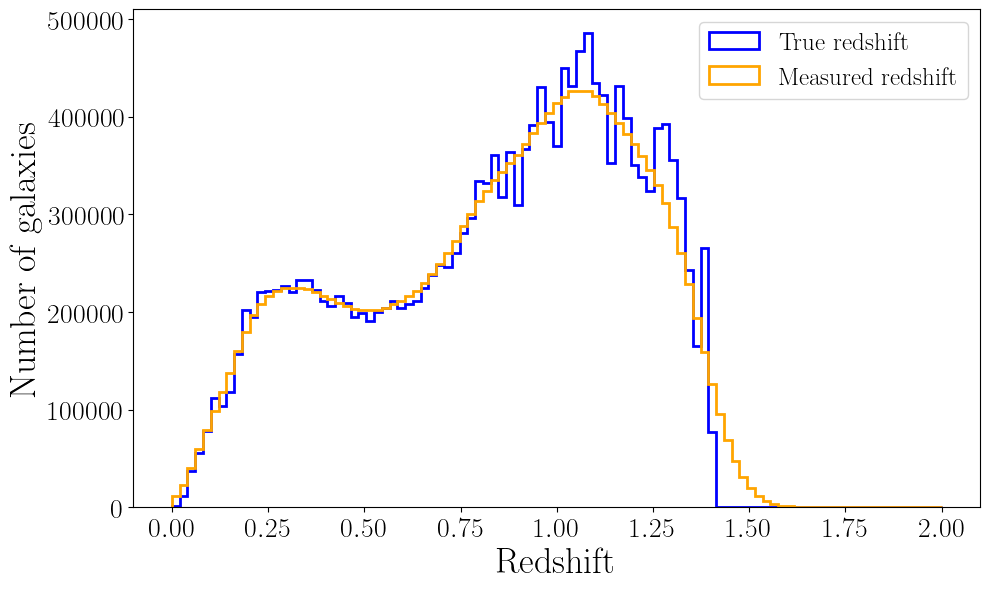

/Users/hayato/research/env/lib/python3.10/site-packages/healpy/visufunc.py:332: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pylab.draw()
/Users/hayato/research/env/lib/python3.10/site-packages/healpy/visufunc.py:1506: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pylab.draw()
/Users/hayato/research/env/lib/python3.10/site-packages/healpy/visufunc.py:1568: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pylab.draw()
/Users/hayato/research/env/lib/python3.10/site-packages/healpy/visufunc.py:1590: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pylab.draw()
/Users/hayato/research/env/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: This figure includes Axes that are not compatible with tight_lay

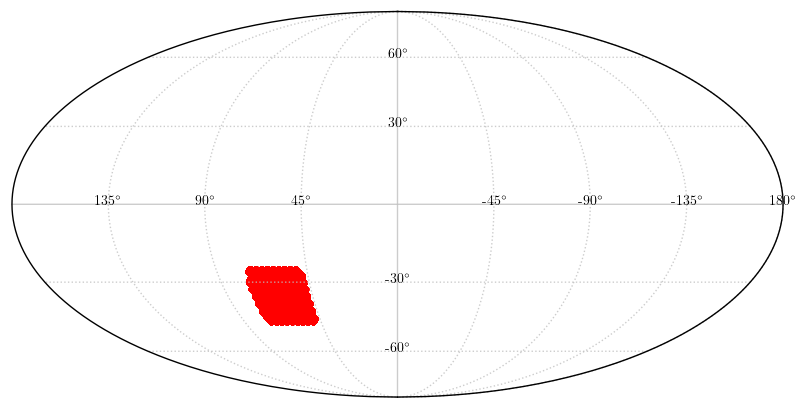

In [5]:
import matplotlib.pyplot as plt
import numpy as np
import healpy as hp

plt.style.use('~/research/my_plot_style.style')
bins = np.linspace(0, 2., 100)
# density = True
density = False
plt.figure()
plt.hist(gal_data_df['redshift_true'], bins=bins, color='blue', label='True redshift', histtype='step', lw=2, density=density)
plt.hist(gal_data_df['redshift_measured'], bins=bins, color='orange', label='Measured redshift', histtype='step', lw=2, density=density)
plt.xlabel('Redshift')
plt.ylabel('Number of galaxies')
plt.grid()
plt.legend()
plt.show()


nside = 32
npix = hp.nside2npix(nside)
hpx_map_white = np.zeros(npix)

plt.figure()
hp.mollview(hpx_map_white, 
            title="", 
            cbar=False, 
            cmap='Greys', 
            min=0, max=1,  # スケールを固定
            notext=True, 
            hold=True)
hp.graticule(dpar=30, dmer=45, color='silver', alpha=0.8)
hp.projscatter(gal_data_df['ra_true'], gal_data_df['dec_true'], 
               lonlat=True, coord='C', 
               s=10, color='red', alpha=0.7, label='Galaxies')
for lat in [-60, -30, 30, 60]:
    hp.projtext(0, lat, rf'{lat}$^\circ$', lonlat=True, fontsize=10, ha='center', color='black')
for lon in [45, 90, 135, 180, -45, -90, -135]:
    label_val = lon if lon <= 180 else lon - 360
    hp.projtext(lon, 0, rf'{label_val}$^\circ$', lonlat=True, fontsize=10, ha='center', color='black')
plt.show()

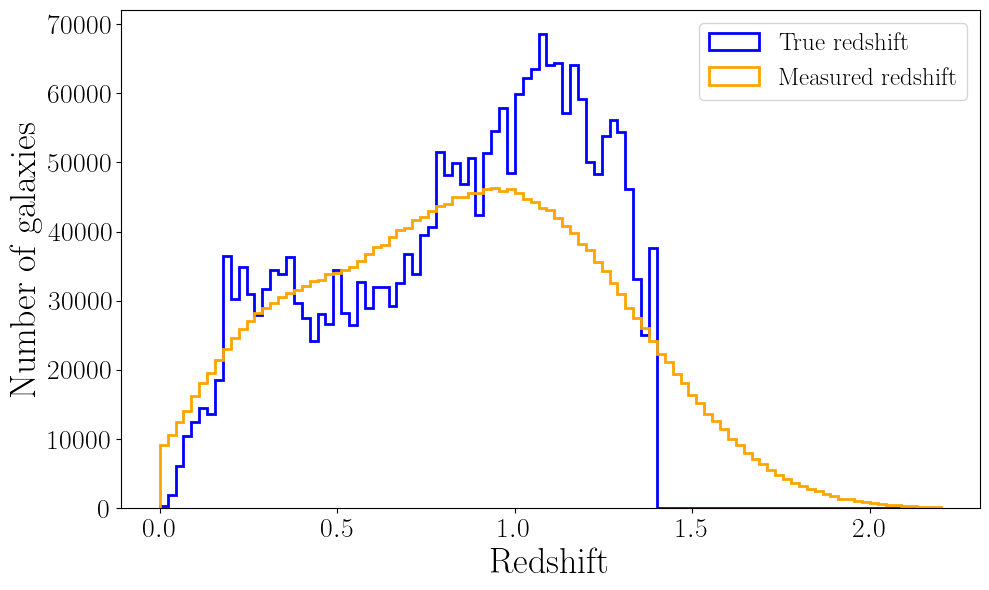

/Users/hayato/research/env/lib/python3.10/site-packages/healpy/visufunc.py:332: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pylab.draw()
/Users/hayato/research/env/lib/python3.10/site-packages/healpy/visufunc.py:1506: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pylab.draw()
/Users/hayato/research/env/lib/python3.10/site-packages/healpy/visufunc.py:1568: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pylab.draw()
/Users/hayato/research/env/lib/python3.10/site-packages/healpy/visufunc.py:1590: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pylab.draw()
/Users/hayato/research/env/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: This figure includes Axes that are not compatible with tight_lay

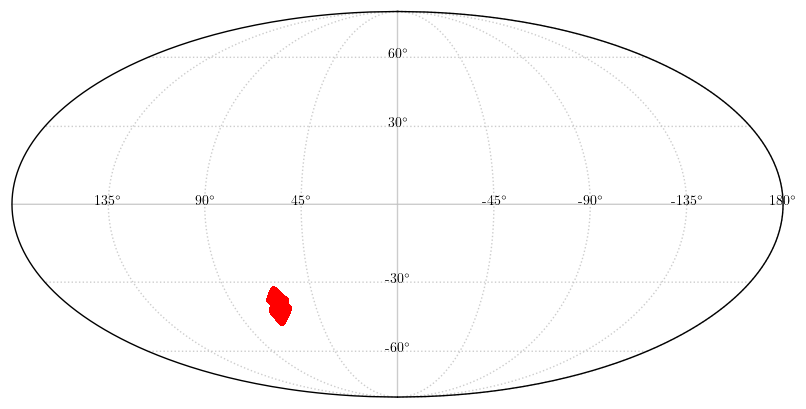

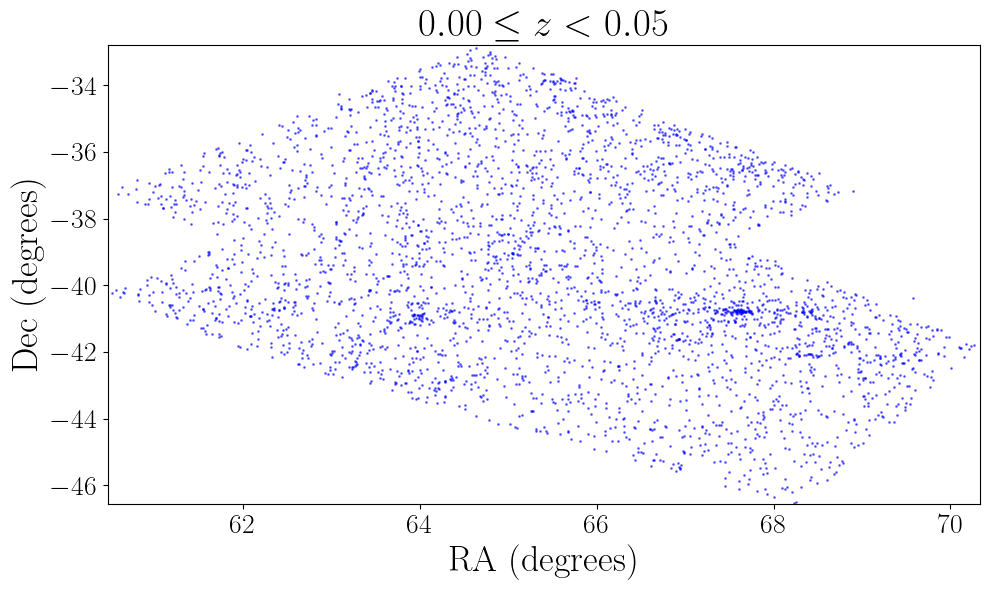

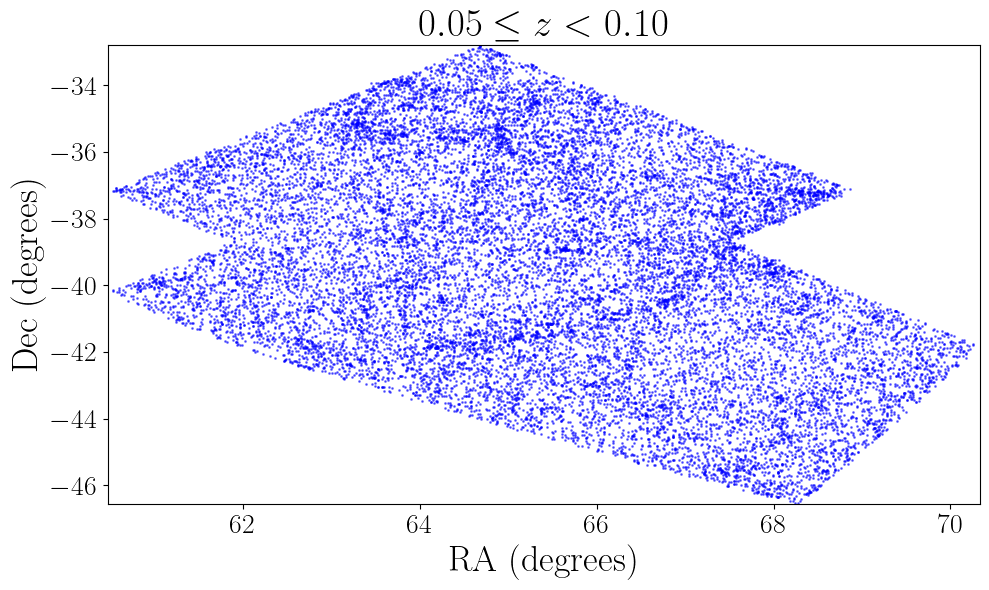

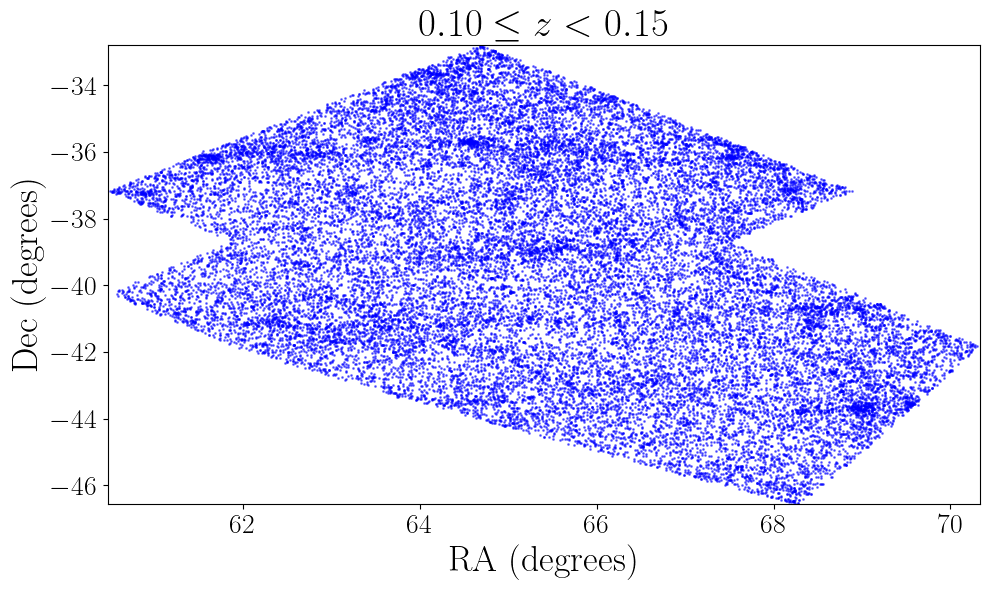

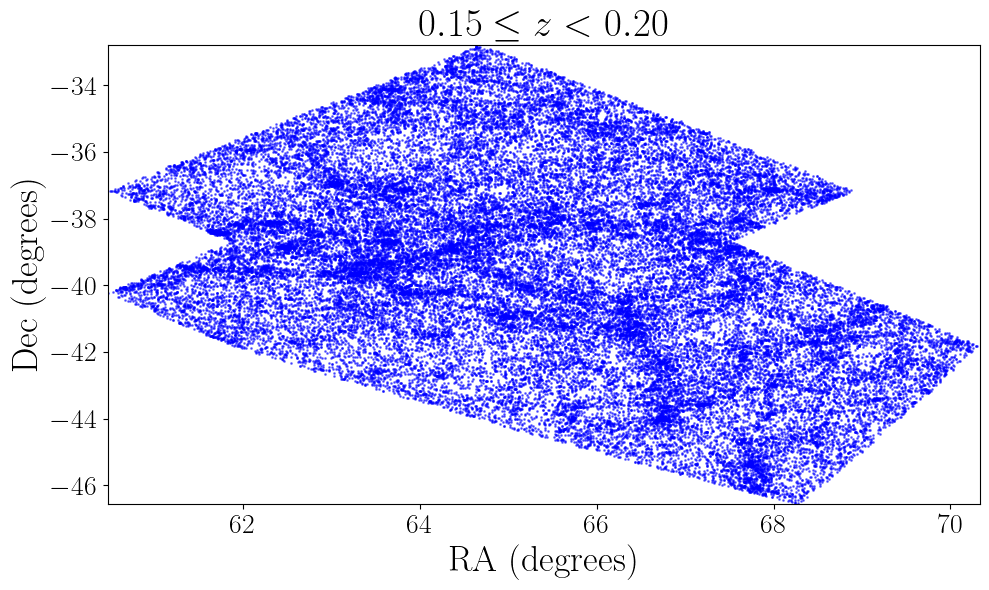

...

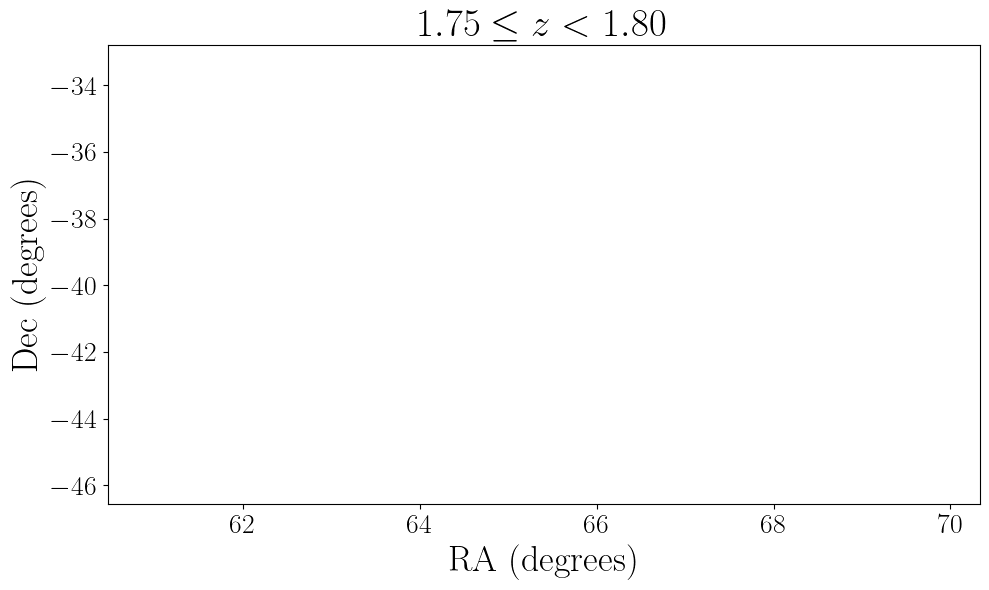

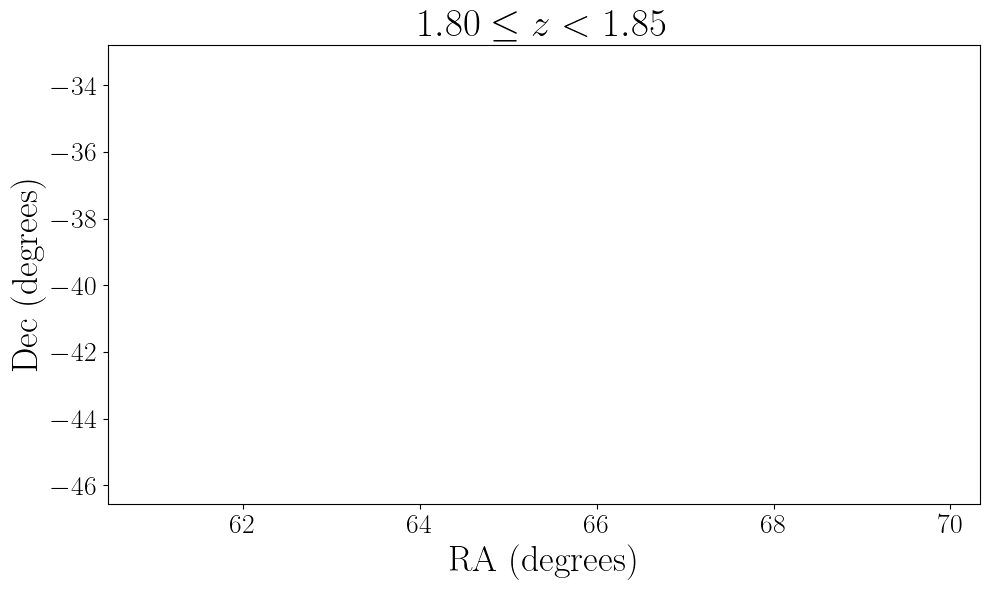

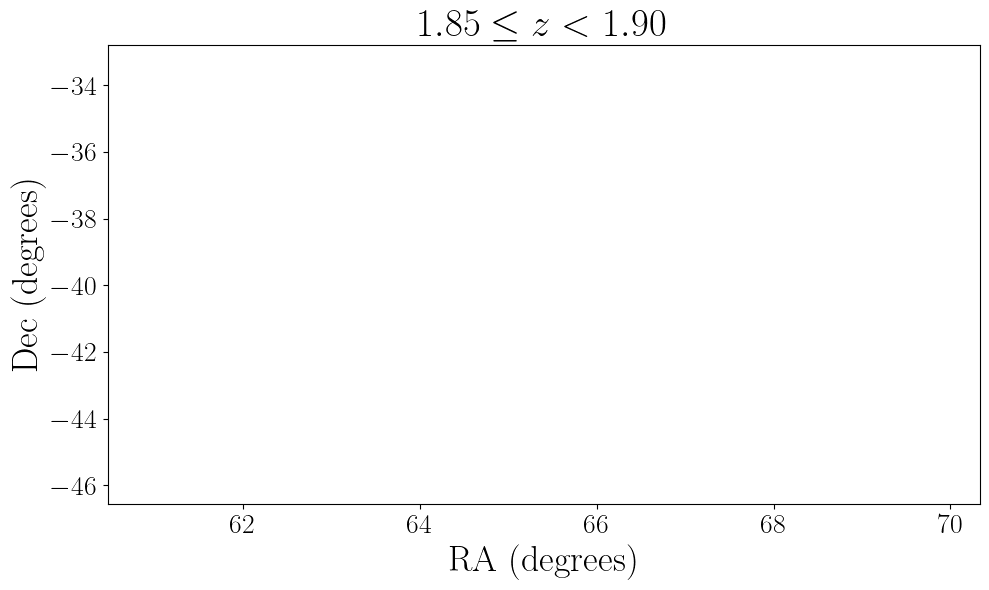

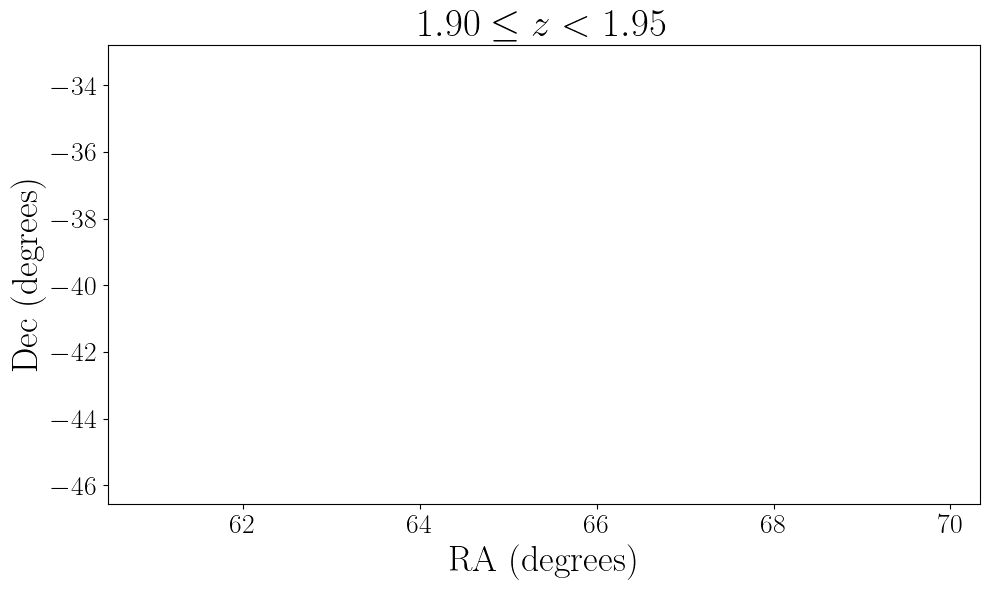

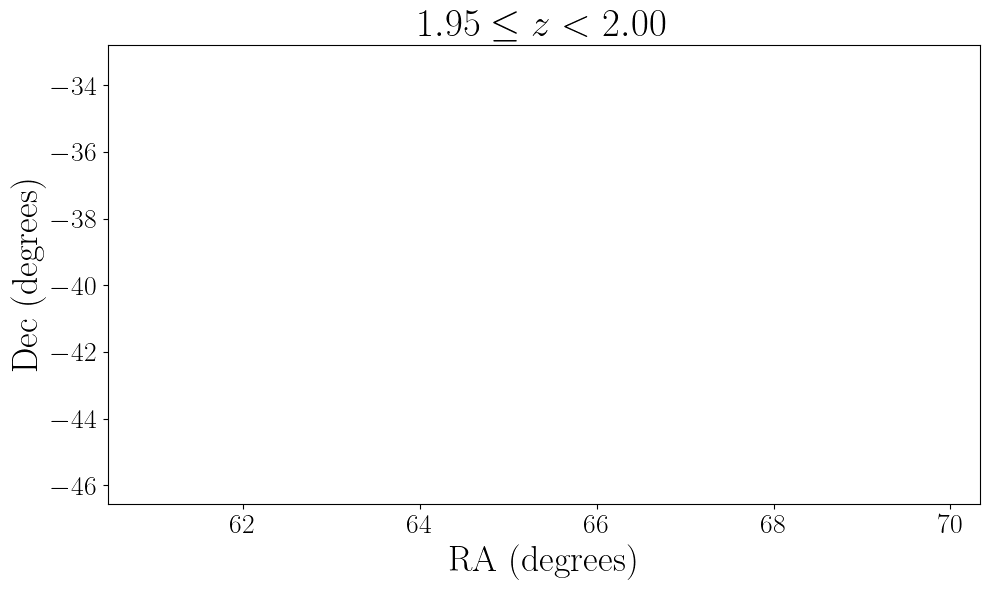

In [7]:
import matplotlib.pyplot as plt
import numpy as np

plt.style.use('~/research/my_plot_style.style')
bins = np.linspace(0, 2.2, 100)
# density = True
density = False
plt.figure()
plt.hist(gal_small_fiducial_df['redshift_true'], bins=bins, color='blue', label='True redshift', histtype='step', lw=2, density=density)
plt.hist(gal_small_fiducial_df['redshift_measured'], bins=bins, color='orange', label='Measured redshift', histtype='step', lw=2, density=density)
plt.xlabel('Redshift')
plt.ylabel('Number of galaxies')
plt.grid()
plt.legend()
plt.show()

nside = 32
npix = hp.nside2npix(nside)
hpx_map_white = np.zeros(npix)

plt.figure()
hp.mollview(hpx_map_white, 
            title="", 
            cbar=False, 
            cmap='Greys', 
            min=0, max=1,  # スケールを固定
            notext=True, 
            hold=True)
hp.graticule(dpar=30, dmer=45, color='silver', alpha=0.8)
hp.projscatter(gal_small_fiducial_df['ra_true'], gal_small_fiducial_df['dec_true'], 
               lonlat=True, coord='C', 
               s=10, color='red', alpha=0.7, label='Galaxies')
for lat in [-60, -30, 30, 60]:
    hp.projtext(0, lat, rf'{lat}$^\circ$', lonlat=True, fontsize=10, ha='center', color='black')
for lon in [45, 90, 135, 180, -45, -90, -135]:
    label_val = lon if lon <= 180 else lon - 360
    hp.projtext(lon, 0, rf'{label_val}$^\circ$', lonlat=True, fontsize=10, ha='center', color='black')
plt.show()

ra = gal_small_fiducial_df['ra_true'].values
dec = gal_small_fiducial_df['dec_true'].values
true_redshifts = gal_small_fiducial_df['redshift_true'].values
z_range = [np.min(true_redshifts), np.max(true_redshifts)]
z_step = 0.05
ra_range = [np.min(ra), np.max(ra)]
dec_range = [np.min(dec), np.max(dec)]
for z in np.arange(np.floor(z_range[0]), np.ceil(z_range[-1]), z_step):
    z_min = z
    z_max = z + z_step
    z_mask = (true_redshifts >= z_min) & (true_redshifts < z_max)
    plt.figure()
    plt.scatter(ra[z_mask], dec[z_mask], s=1, c='blue', alpha=0.5)
    plt.xlabel('RA (degrees)')
    plt.ylabel('Dec (degrees)')
    plt.xlim(ra_range)
    plt.ylim(dec_range)
    plt.grid()
    plt.title(rf'${z_min:.2f} \leq z < {z_max:.2f}$')
    plt.show()

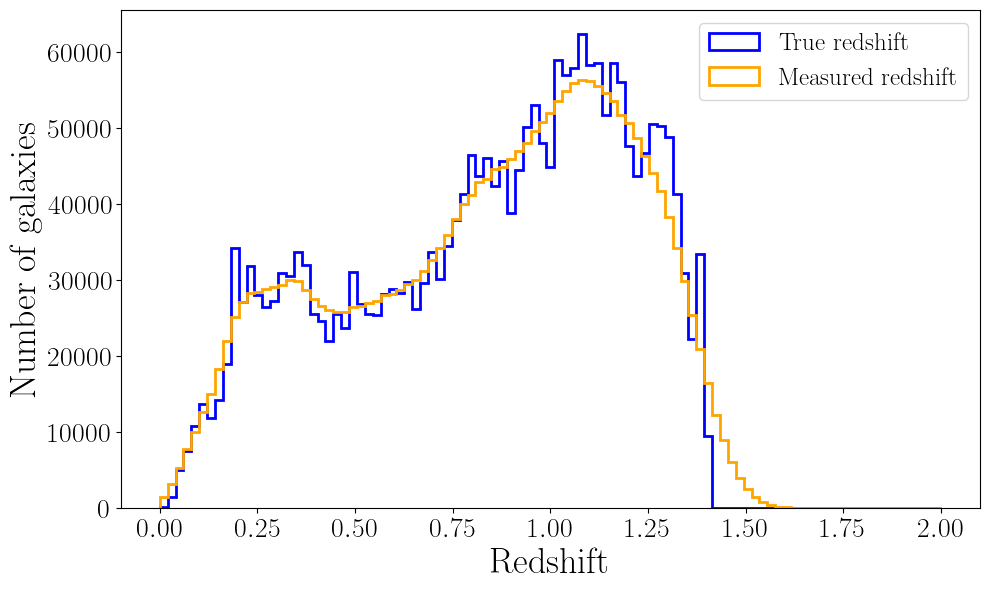

/Users/hayato/research/env/lib/python3.10/site-packages/healpy/visufunc.py:332: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pylab.draw()
/Users/hayato/research/env/lib/python3.10/site-packages/healpy/visufunc.py:1506: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pylab.draw()
/Users/hayato/research/env/lib/python3.10/site-packages/healpy/visufunc.py:1568: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pylab.draw()
/Users/hayato/research/env/lib/python3.10/site-packages/healpy/visufunc.py:1590: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pylab.draw()
/Users/hayato/research/env/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: This figure includes Axes that are not compatible with tight_lay

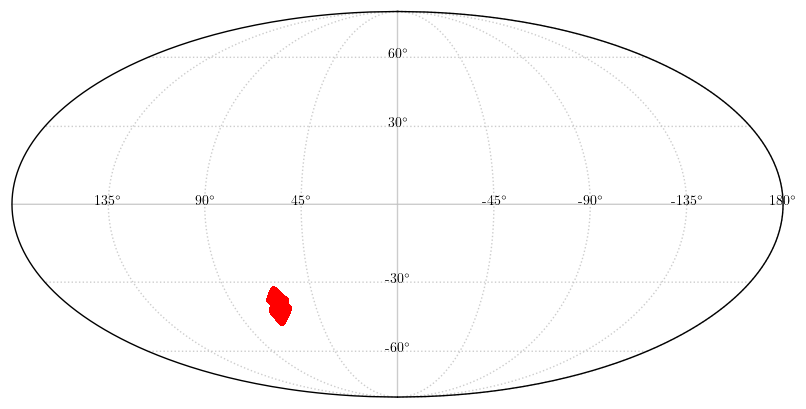

In [8]:
import matplotlib.pyplot as plt
import numpy as np

plt.style.use('~/research/my_plot_style.style')
bins = np.linspace(0, 2., 100)
# density = True
density = False
plt.figure()
plt.hist(gal_small_modeled_df['redshift_true'], bins=bins, color='blue', label='True redshift', histtype='step', lw=2, density=density)
plt.hist(gal_small_modeled_df['redshift_measured'], bins=bins, color='orange', label='Measured redshift', histtype='step', lw=2, density=density)
plt.xlabel('Redshift')
plt.ylabel('Number of galaxies')
plt.grid()
plt.legend()
plt.show()

nside = 32
npix = hp.nside2npix(nside)
hpx_map_white = np.zeros(npix)

plt.figure()
hp.mollview(hpx_map_white, 
            title="", 
            cbar=False, 
            cmap='Greys', 
            min=0, max=1,  # スケールを固定
            notext=True, 
            hold=True)
hp.graticule(dpar=30, dmer=45, color='silver', alpha=0.8)
hp.projscatter(gal_small_modeled_df['ra_true'], gal_small_modeled_df['dec_true'], 
               lonlat=True, coord='C', 
               s=10, color='red', alpha=0.7, label='Galaxies')
for lat in [-60, -30, 30, 60]:
    hp.projtext(0, lat, rf'{lat}$^\circ$', lonlat=True, fontsize=10, ha='center', color='black')
for lon in [45, 90, 135, 180, -45, -90, -135]:
    label_val = lon if lon <= 180 else lon - 360
    hp.projtext(lon, 0, rf'{label_val}$^\circ$', lonlat=True, fontsize=10, ha='center', color='black')
plt.show()

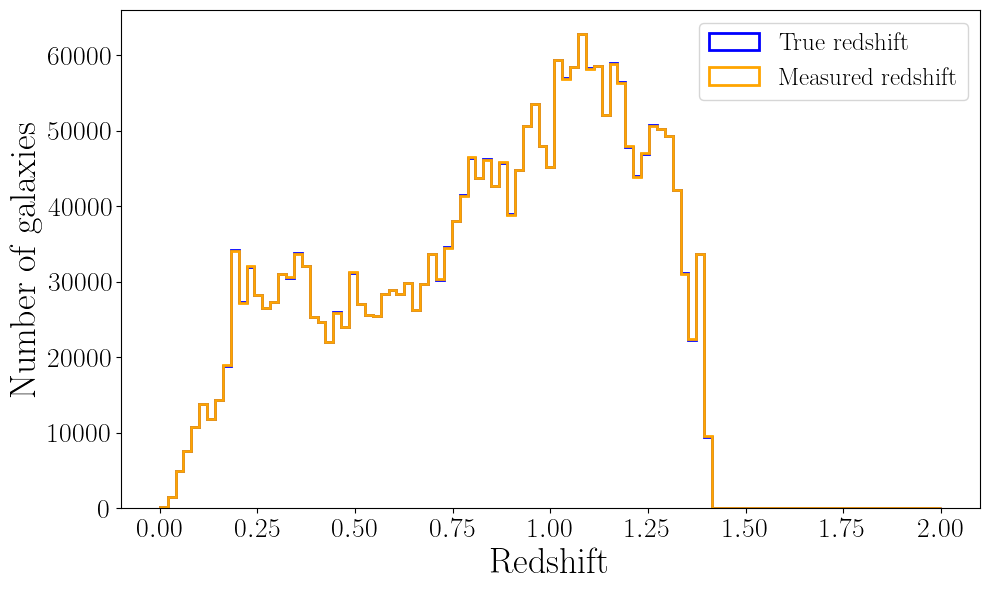

/Users/hayato/research/env/lib/python3.10/site-packages/healpy/visufunc.py:332: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pylab.draw()
/Users/hayato/research/env/lib/python3.10/site-packages/healpy/visufunc.py:1506: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pylab.draw()
/Users/hayato/research/env/lib/python3.10/site-packages/healpy/visufunc.py:1568: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pylab.draw()
/Users/hayato/research/env/lib/python3.10/site-packages/healpy/visufunc.py:1590: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pylab.draw()
/Users/hayato/research/env/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: This figure includes Axes that are not compatible with tight_lay

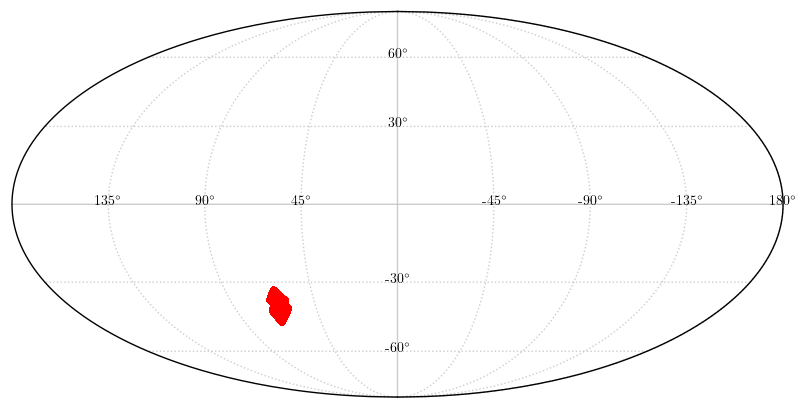

In [9]:
import matplotlib.pyplot as plt
import numpy as np

plt.style.use('~/research/my_plot_style.style')
bins = np.linspace(0, 2., 100)
# density = True
density = False
plt.figure()
plt.hist(gal_small_spectro_df['redshift_true'], bins=bins, color='blue', label='True redshift', histtype='step', lw=2, density=density)
plt.hist(gal_small_spectro_df['redshift_measured'], bins=bins, color='orange', label='Measured redshift', histtype='step', lw=2, density=density)
plt.xlabel('Redshift')
plt.ylabel('Number of galaxies')
plt.grid()
plt.legend()
plt.show()

nside = 32
npix = hp.nside2npix(nside)
hpx_map_white = np.zeros(npix)

plt.figure()
hp.mollview(hpx_map_white, 
            title="", 
            cbar=False, 
            cmap='Greys', 
            min=0, max=1,  # スケールを固定
            notext=True, 
            hold=True)
hp.graticule(dpar=30, dmer=45, color='silver', alpha=0.8)
hp.projscatter(gal_small_spectro_df['ra_true'], gal_small_spectro_df['dec_true'], 
               lonlat=True, coord='C', 
               s=10, color='red', alpha=0.7, label='Galaxies')
for lat in [-60, -30, 30, 60]:
    hp.projtext(0, lat, rf'{lat}$^\circ$', lonlat=True, fontsize=10, ha='center', color='black')
for lon in [45, 90, 135, 180, -45, -90, -135]:
    label_val = lon if lon <= 180 else lon - 360
    hp.projtext(lon, 0, rf'{label_val}$^\circ$', lonlat=True, fontsize=10, ha='center', color='black')
plt.show()

# cutoff

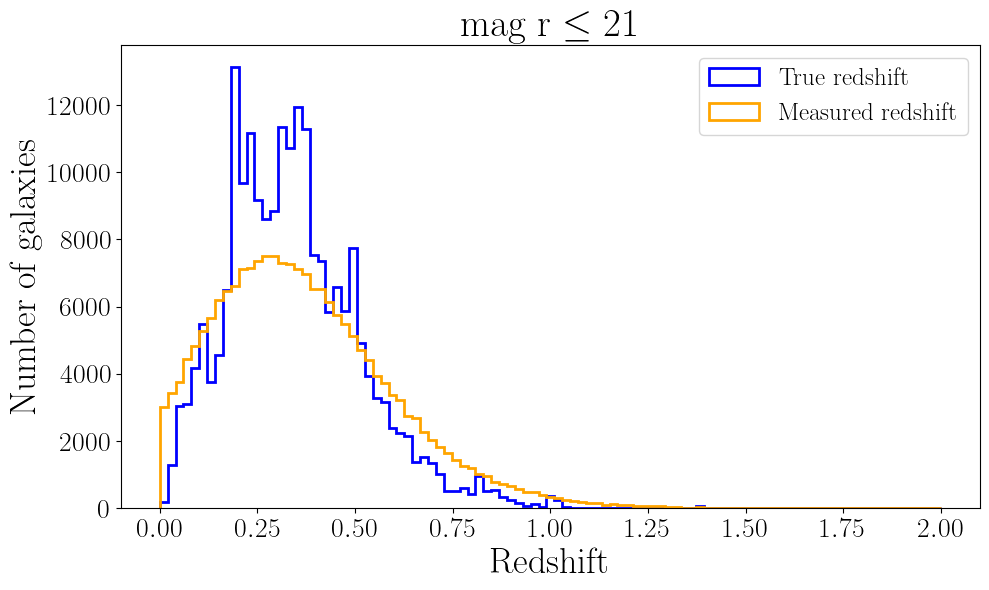

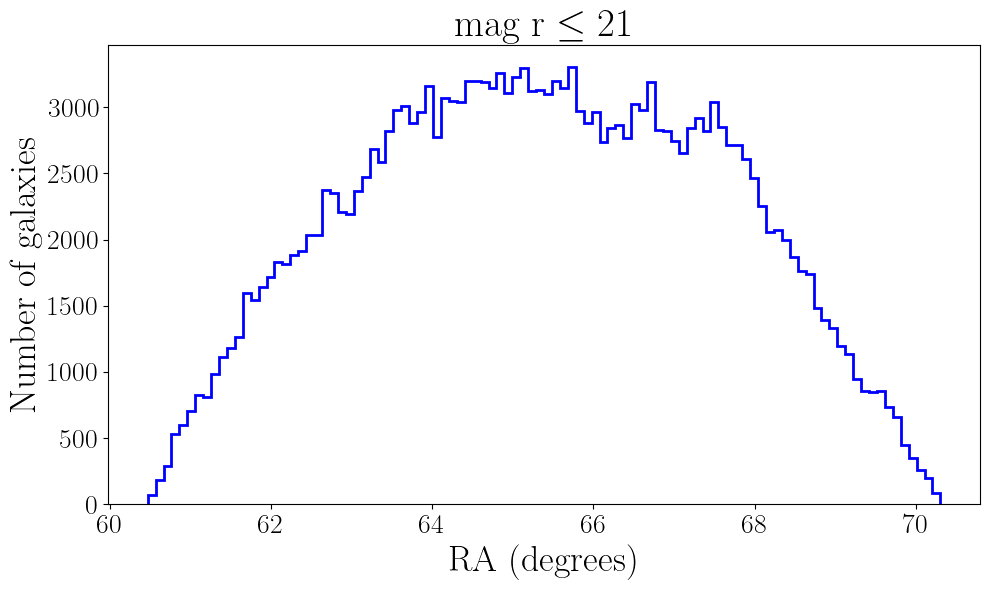

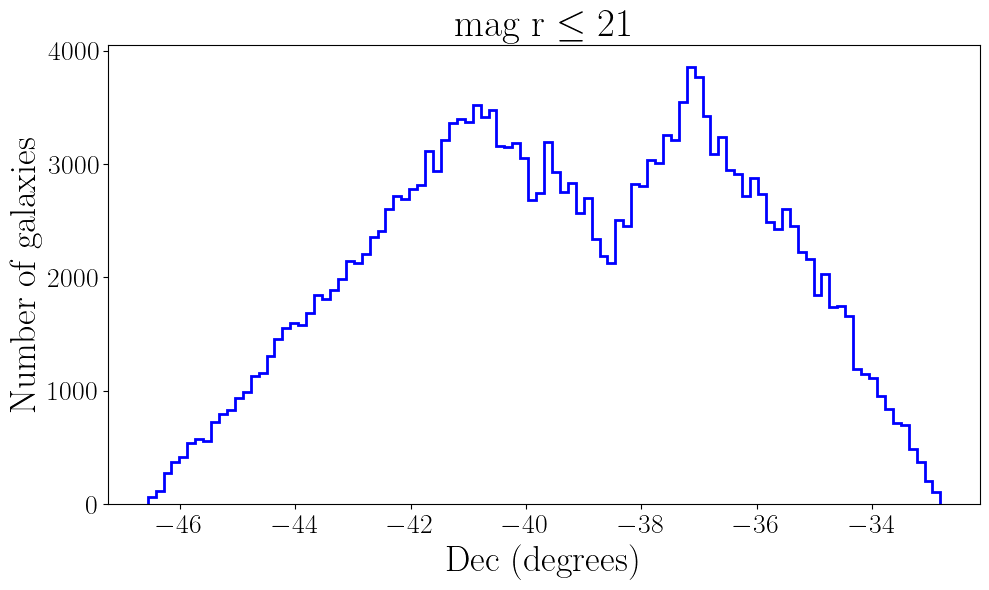

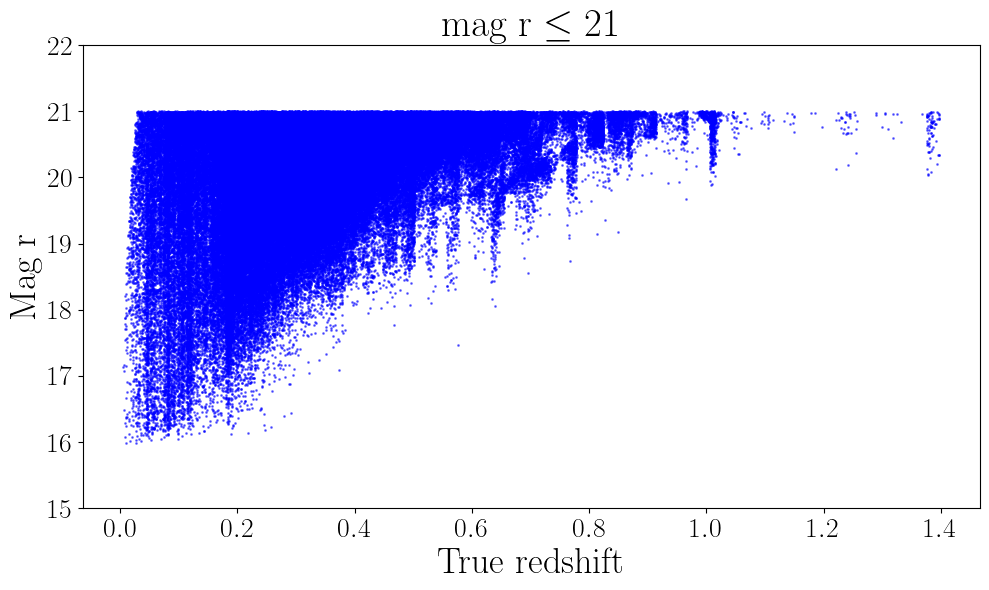

In [10]:
galcat_df = gal_small_fiducial_df.copy()

mag_cut_r = 21

mask = galcat_df['mag_true_r_lsst_no_host_extinction'] <= mag_cut_r

true_redshifts_masked = galcat_df.loc[mask, 'redshift_true']
true_redshifts_range = [np.min(true_redshifts_masked), np.max(true_redshifts_masked)]
measured_redshifts_masked = galcat_df.loc[mask, 'redshift_measured']
plt.style.use('~/research/my_plot_style.style')
bins = np.linspace(0, 2., 100)
# density = True
density = False
plt.figure()
plt.hist(true_redshifts_masked, bins=bins, color='blue', label='True redshift', histtype='step', lw=2, density=density)
plt.hist(measured_redshifts_masked, bins=bins, color='orange', label='Measured redshift', histtype='step', lw=2, density=density)
plt.xlabel('Redshift')
plt.ylabel('Number of galaxies')
plt.grid()
plt.legend()
plt.title(rf'mag r $\leq {mag_cut_r}$')
plt.show()

bins = 100
ra_masked = galcat_df.loc[mask, 'ra_true']
dec_masked = galcat_df.loc[mask, 'dec_true']
ra_range = [np.min(ra_masked), np.max(ra_masked)]
dec_range = [np.min(dec_masked), np.max(dec_masked)]
plt.figure()
plt.hist(ra_masked, bins=bins, color='blue', histtype='step', lw=2)
plt.xlabel('RA (degrees)')
plt.ylabel('Number of galaxies')
plt.grid()
plt.title(rf'mag r $\leq {mag_cut_r}$')
plt.show()

plt.figure()
plt.hist(dec_masked, bins=bins, color='blue', histtype='step', lw=2)
plt.xlabel('Dec (degrees)')
plt.ylabel('Number of galaxies')
plt.grid()
plt.title(rf'mag r $\leq {mag_cut_r}$')
plt.show()

mag_r_masked = galcat_df.loc[mask, 'mag_true_r_lsst_no_host_extinction']
plt.figure()
plt.scatter(true_redshifts_masked, mag_r_masked, s=1, c='blue', alpha=0.5)
plt.xlabel('True redshift')
plt.ylabel('Mag r')
plt.grid()
plt.title(rf'mag r $\leq {mag_cut_r}$')
plt.ylim([15, mag_cut_r + 1])
plt.show()